In [20]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
import numpy as np
from shapely.geometry import Polygon, Point
import matplotlib.patches as patches# Create figure and axes
# Swimmer data set class imbalance
import glob
import os
import swifter

In [3]:
# important directories
result_root = r'/Users/krish/ljmu/3.results/25112022-Figures_for_thesis/'
Path(result_root).mkdir(parents=True, exist_ok=True)
root_path =  r'/Users/krish/ljmu/1.data/afo/'

In [4]:
df = pd.read_csv(root_path + 'images/all_images.csv')

In [5]:
df

,Unnamed: 0,file_name,humans,number_of_humans
0,0,/Users/krish/ljmu/1.data/afo/images/b1_37.jpg,1,34
1,1,/Users/krish/ljmu/1.data/afo/images/r2_94.jpg,1,3
2,2,/Users/krish/ljmu/1.data/afo/images/b1_23.jpg,1,35
3,3,/Users/krish/ljmu/1.data/afo/images/r2_80.jpg,1,3
4,4,/Users/krish/ljmu/1.data/afo/images/s5_5.jpg,0,0
...,...,...,...,...
3636,3636,/Users/krish/ljmu/1.data/afo/images/a_184.jpg,1,5
3637,3637,/Users/krish/ljmu/1.data/afo/images/s5_8.jpg,0,0
3638,3638,/Users/krish/ljmu/1.data/afo/images/s2_107.jpg,1,1
3639,3639,/Users/krish/ljmu/1.data/afo/images/a_1184.jpg,1,46


<AxesSubplot: ylabel='Count'>

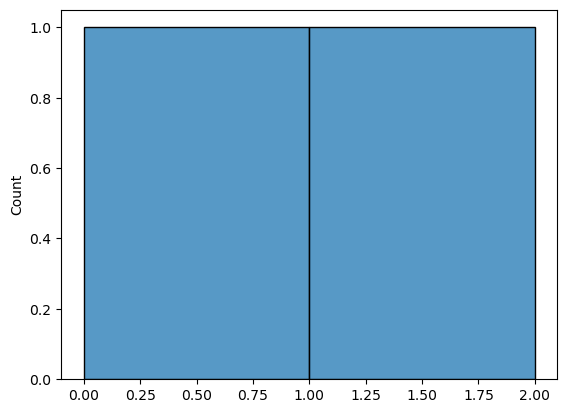

In [6]:
sns.histplot(data = df['humans'],  bins = 2, stat = 'count',x={0:0,1:2})

<AxesSubplot: xlabel='humans', ylabel='Count'>

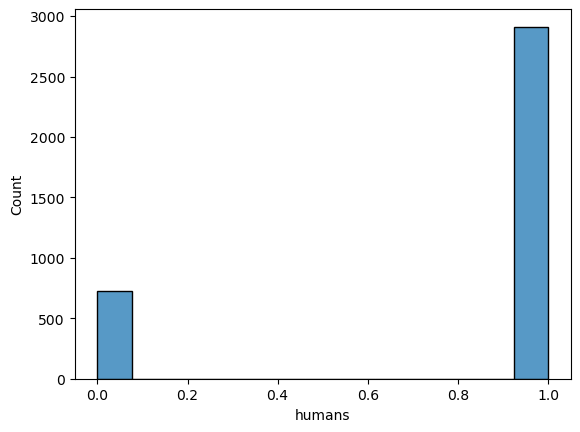

In [7]:
sns.histplot(data = df['humans'])

In [8]:
?sns.countplot

Text(0.5, 1.0, 'class distribution in AFO')

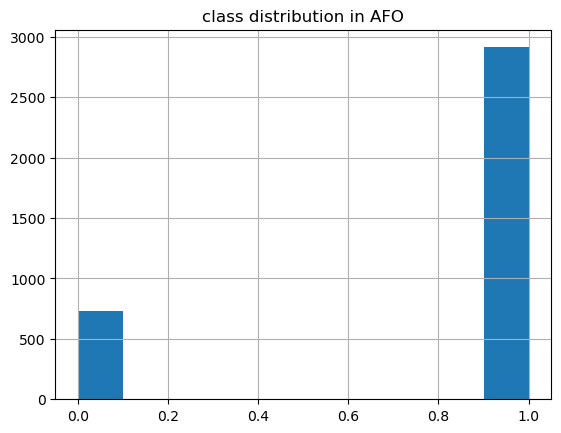

In [9]:
df.hist(column='humans')#, bins = 3)
plt.title('class distribution in AFO')

Text(0.5, 1.0, 'number_of_humans_afo')

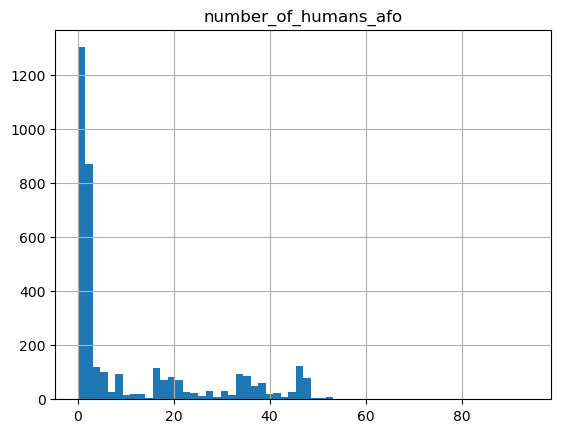

In [10]:
df.hist(column='number_of_humans',bins = 60)
plt.title('number_of_humans_afo')

Text(0.5, 1.0, 'number_of_humans_afo')

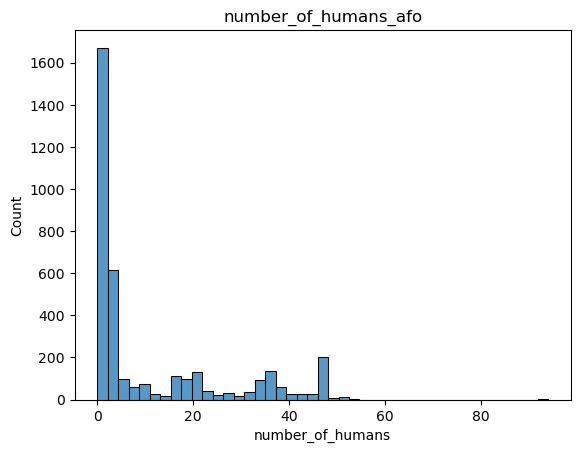

In [11]:
# This figure was done using category1 label 
sns.histplot(data = df['number_of_humans'])

plt.title('number_of_humans_afo')

In [13]:
# I want the figure above for category 2 to understand the distribution of density
# Script taken from 19112022-new_pipeline-resnet50




In [14]:
def all_image(imname):
    label_path = '/Users/krish/ljmu/1.data/afo/2categories/'+imname.split('/')[-1].replace('.jpg','.txt')
    with open(label_path,'r') as fp:
        number_of_human = int(len(fp.readlines()))
    if (number_of_human == 0): 
        return pd.Series([0,number_of_human])
    else:
        return pd.Series([1,number_of_human])

In [15]:
import swifter

In [16]:
total_images_df = pd.DataFrame(columns = ['file_name','humans','number_of_humans']) # A dataframe that contains all the images
total_images_df['file_name'] = glob.glob('/Users/krish/ljmu/1.data/afo/images/*.jpg')
total_images_df[['humans','number_of_humans']] = total_images_df['file_name'].swifter.allow_dask_on_strings(enable = True).apply(all_image)
#total_images['number_of_humans'] = total_images['file_name'].swifter.allow_dask_on_strings(enable = True).apply(all_image_number_of_humans)

total_images_df.to_csv('/Users/krish/ljmu/1.data/afo/images/all_images_category2.csv')


Pandas Apply:   0%|          | 0/3641 [00:00<?, ?it/s]

In [17]:
total_images_df

,file_name,humans,number_of_humans
0,/Users/krish/ljmu/1.data/afo/images/b1_37.jpg,1,34
1,/Users/krish/ljmu/1.data/afo/images/r2_94.jpg,1,3
2,/Users/krish/ljmu/1.data/afo/images/b1_23.jpg,1,35
3,/Users/krish/ljmu/1.data/afo/images/r2_80.jpg,1,3
4,/Users/krish/ljmu/1.data/afo/images/s5_5.jpg,0,0
...,...,...,...
3636,/Users/krish/ljmu/1.data/afo/images/a_184.jpg,1,5
3637,/Users/krish/ljmu/1.data/afo/images/s5_8.jpg,0,0
3638,/Users/krish/ljmu/1.data/afo/images/s2_107.jpg,1,1
3639,/Users/krish/ljmu/1.data/afo/images/a_1184.jpg,1,46


Text(0.5, 1.0, 'number_of_humans_afo')

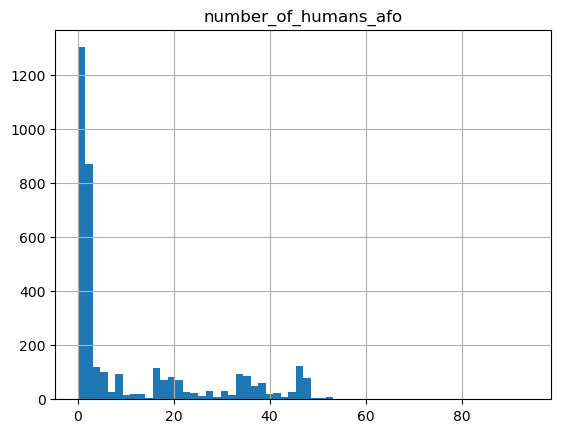

In [19]:
total_images_df.hist(column='number_of_humans',bins = 60)
plt.title('number_of_humans_afo')
# this was a pointless waste of time as the hists look exactly the same


In [12]:
# Class imbalance after tiling
df_tile_train = pd.read_csv(root_path+'tiled/afo_train_df.csv')

Text(0.5, 1.0, 'class distribution in AFO')

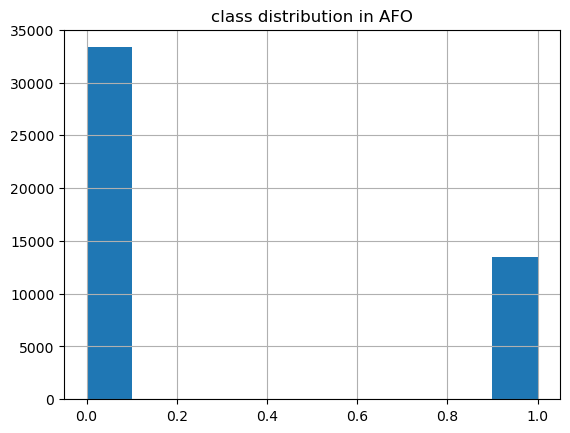

In [13]:
df_tile_train.hist(column='humans')
plt.title('class distribution in AFO')

**why we picked 500X500**

In [15]:
# Why we picked 500X500
# get all image names
imname = root_path+'images/a_1018.jpg'
#imnames = glob.glob('/content/drive/MyDrive/ljmu/1.data/swimmers_dataset/krish_train/*.jpg')
# specify path for a new tiled dataset
#newpath = '/Users/krish/ljmu/1.data/sampletiled/ts/'
#newpath = '/content/drive/MyDrive/ljmu/1.data/sampletiled/ts'
#falsepath = '/Users/krish/ljmu/1.data/sampletiled/false/'
#falsepath = '/content/drive/MyDrive/ljmu/1.data/sampletiled/false'
# python program to check if a path exists
#if path doesn’t exist we create a new path

In [16]:

im = Image.open(imname)
imr = np.array(im, dtype=np.uint8)
height = imr.shape[0]
width = imr.shape[1]
labname = root_path+'1category_labels/'+imname.split('/')[-1].replace('.jpg', '.txt')
labels = pd.read_csv(labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])
    
    # we need to rescale coordinates from 0-1 to real image height and width
labels[['x1', 'w']] = labels[['x1', 'w']] * width
labels[['y1', 'h']] = labels[['y1', 'h']] * height
    
boxes = []

In [17]:
for row in labels.iterrows():
    x1 = row[1]['x1'] - row[1]['w']/2
    y1 = (height - row[1]['y1']) - row[1]['h']/2
    x2 = row[1]['x1'] + row[1]['w']/2
    y2 = (height - row[1]['y1']) + row[1]['h']/2

    boxes.append((int(row[1]['class']), Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))

In [18]:
df_scaled = labels.iloc[:, 1:]
df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]

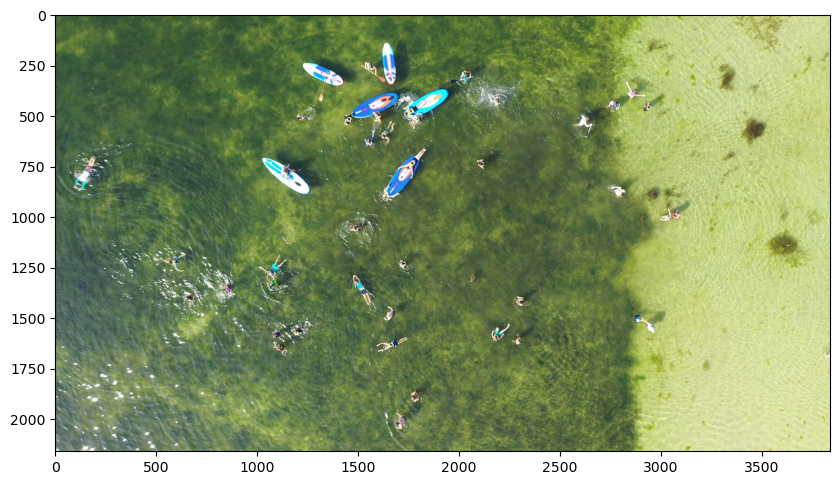

In [19]:

fig,ax = plt.subplots(1, figsize=(10,10))# Display the image
ax.imshow(imr)
for box in df_scaled.values:
    # Create a Rectangle patch
    rect = patches.Rectangle((box[0]-(box[2]/2),box[1]-(box[3]/2)),box[2],box[3],linewidth=2,edgecolor='b',facecolor='none')# Add the patch to the axes
    ax.add_patch(rect)
    
plt.show()

In [20]:
# #creating a new directory called pythondirectory
# Path(newpath).mkdir(parents=True, exist_ok=True)
# Path(falsepath).mkdir(parents=True, exist_ok=True)

# specify slice width=height
slice_size = 500

# tile all images in a loop

for imname in imnames:
    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    labname = imname.replace('.jpg', '.txt')
    labels = pd.read_csv(labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])
    
    # we need to rescale coordinates from 0-1 to real image height and width
    labels[['x1', 'w']] = labels[['x1', 'w']] * width
    labels[['y1', 'h']] = labels[['y1', 'h']] * height
    
    boxes = []
    #print(labels)
    # convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
    for row in labels.iterrows():
        x1 = row[1]['x1'] - row[1]['w']/2
        y1 = (height - row[1]['y1']) - row[1]['h']/2
        x2 = row[1]['x1'] + row[1]['w']/2
        y2 = (height - row[1]['y1']) + row[1]['h']/2

        boxes.append((int(row[1]['class']), Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))
    
    counter = 0
    print('Image:', imname)
    # create tiles and find intersection with bounding boxes for each tile
    for i in range((height // slice_size)):
        for j in range((width // slice_size)):
            x1 = j*slice_size
            y1 = height - (i*slice_size)
            x2 = ((j+1)*slice_size) - 1
            y2 = (height - (i+1)*slice_size) + 1

            pol = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
            imsaved = False
            slice_labels = []

            for box in boxes:
                if pol.intersects(box[1]):
                    inter = pol.intersection(box[1])        
                    
                    if not imsaved:
                        sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                        sliced_im = Image.fromarray(sliced)
                        filename = imname.split('/')[-1]
                        ##filename = imname
                        slice_path = newpath + filename.replace('.jpg', f'_{i}_{j}.jpg')
                        
                        slice_labels_path = newpath + filename.replace('.jpg', f'_{i}_{j}.txt')
                        
                        print(slice_path)
                        #print('hi')
                        sliced_im.save(slice_path)
                        imsaved = True                    
                    
                    # get the smallest polygon (with sides parallel to the coordinate axes) that contains the intersection
                    new_box = inter.envelope 
                    
                    # get central point for the new bounding box 
                    centre = new_box.centroid
                    
                    # get coordinates of polygon vertices
                    x, y = new_box.exterior.coords.xy
                    
                    # get bounding box width and height normalized to slice size
                    new_width = (max(x) - min(x)) / slice_size
                    new_height = (max(y) - min(y)) / slice_size
                    
                    # we have to normalize central x and invert y for yolo format
                    new_x = (centre.coords.xy[0][0] - x1) / slice_size
                    new_y = (y1 - centre.coords.xy[1][0]) / slice_size
                    
                    counter += 1

                    slice_labels.append([box[0], new_x, new_y, new_width, new_height])
            
            # save txt with labels for the current tile
            if len(slice_labels) > 0:
                slice_df = pd.DataFrame(slice_labels, columns=['class', 'x1', 'y1', 'w', 'h'])
                #print(slice_df)
                slice_df.to_csv(slice_labels_path, sep=' ', index=False, header=False, float_format='%.6f')
            
            # if there are no bounding boxes intersect current tile, save this tile to a separate folder 
            if not imsaved:
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                sliced_im = Image.fromarray(sliced)
                filename = imname.split('/')[-1]
                #filename = imname
                slice_path = falsepath + filename.replace('.jpg', f'_{i}_{j}.jpg')                

                sliced_im.save(slice_path)
                print('Slice without boxes saved')
                imsaved = True
    #break

NameError: name 'imnames' is not defined

In [21]:
imname = root_path+'images/a_1018.jpg'
im = Image.open(imname)
imr = np.array(im, dtype=np.uint8)

labname = root_path+'1category_labels/'+imname.split('/')[-1].replace('.jpg', '.txt')
df = pd.read_csv(labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])

In [22]:
df_scaled = df.iloc[:, 1:]
df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]

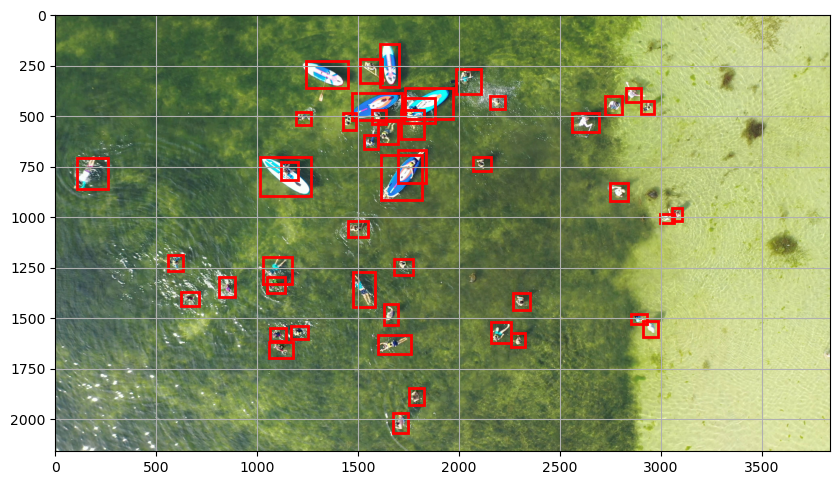

In [23]:

fig,ax = plt.subplots(1, figsize=(10,10))# Display the image
ax.imshow(imr)
for box in df_scaled.values:
    # Create a Rectangle patch
    rect = patches.Rectangle((box[0]-(box[2]/2),box[1]-(box[3]/2)),box[2],box[3],linewidth=2,edgecolor='r',facecolor='none')# Add the patch to the axes
    ax.add_patch(rect)
plt.grid(alpha = 1)    
plt.show()

In [25]:
root_path = '/Users/krish/ljmu/1.data/swimmers_dataset/'

In [26]:
df_basic = pd.DataFrame(columns=['Name','contains_human','number_of_human'])
for annotation in glob.glob(root_path+'training_dataset/[0-9]*.txt'):
    with open(annotation,'r') as fp:
        number_of_human = len(fp.readlines())
    if number_of_human:
        contains_human = int(1)
    else:
        contains_human = int(0)
    annotation = os.path.splitext(annotation)[0]+'.jpg' 
    ser_app = pd.Series([annotation,contains_human,number_of_human],index = ['Name','contains_human','number_of_human'])
    df_basic = df_basic.append(ser_app, ignore_index=True)

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_basic = df_basic.append(ser_app, ignore_index=True)
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_24697/4231203848.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future v

In [27]:
df_basic

,Name,contains_human,number_of_human
0,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,3
1,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,3
2,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0
3,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,2
4,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,6
...,...,...,...
5782,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0
5783,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,1
5784,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0
5785,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0


In [28]:
df_basic['contains_human'] = df_basic['contains_human'].apply(lambda x: int(x))
df_basic['number_of_human'] = df_basic['number_of_human'].apply(lambda x: int(x))

Text(0.5, 1.0, 'class distribution in swimmer dataset')

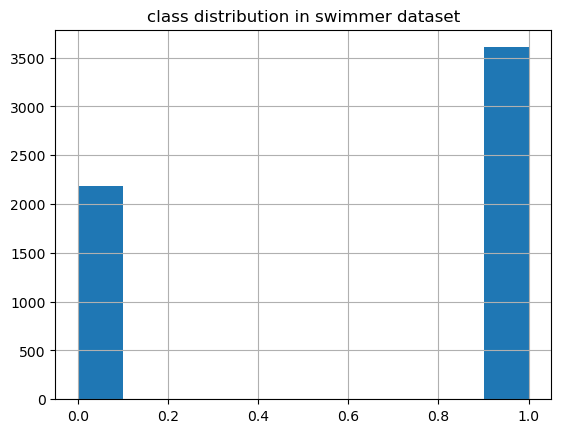

In [29]:
df_basic.hist(column='contains_human')
plt.title('class distribution in swimmer dataset')


array([[<AxesSubplot: title={'center': 'number_of_human'}>]], dtype=object)

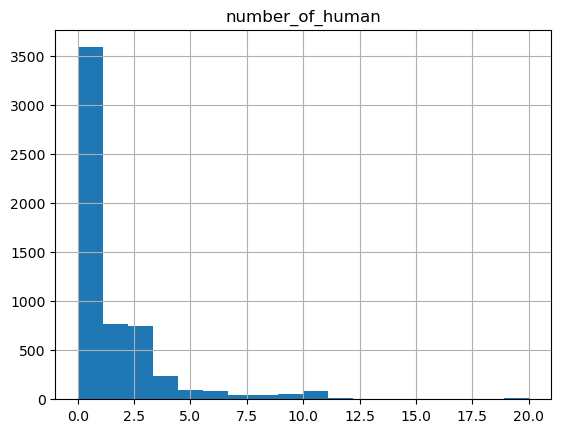

In [30]:
df_basic.hist(column='number_of_human',bins = 18)

In [31]:
df_basic['contains_human'].dtype

dtype('int64')

In [32]:
len(list(glob.glob(root_path+'training_dataset/[0-9]*.txt')))

5787

In [33]:
### Area occupied by the bounding boxes for the swimmers dataset.

In [34]:
# Calcluating the area percentage of the bounding box
label_name = root_path + 'training_dataset/2363.txt'
labname = root_path + 'training_dataset/2363.txt'
labels = pd.read_csv(labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])

In [35]:
labels

,class,x1,y1,w,h
0,0,0.627734,0.780556,0.047656,0.091667
1,0,0.949219,0.943750,0.040625,0.084722
2,0,0.924609,0.750000,0.060156,0.113889
3,0,0.824219,0.670139,0.040625,0.084722
4,0,0.887500,0.576389,0.032812,0.061111
5,0,0.937109,0.548611,0.027344,0.063889
6,0,0.980859,0.445833,0.025781,0.036111
7,0,0.901563,0.411111,0.020312,0.036111
8,0,0.386719,0.461111,0.026563,0.058333
9,0,0.428516,0.404167,0.030469,0.050000


In [36]:
imname = root_path + 'training_dataset/2363.jpg'
im = Image.open(imname)
imr = np.array(im, dtype=np.uint8)
height = imr.shape[0]
width = imr.shape[1]

labels[['x1', 'w']] = labels[['x1', 'w']] * width
labels[['y1', 'h']] = labels[['y1', 'h']] * height

In [46]:
boxes = []
area_percentage = []
#print(labels)
# convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
for row in labels.iterrows():
    x1 = row[1]['x1'] - row[1]['w']/2
    y1 = (height - row[1]['y1']) - row[1]['h']/2
    x2 = row[1]['x1'] + row[1]['w']/2
    y2 = (height - row[1]['y1']) + row[1]['h']/2

    polygon_bounding_box = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
    boxes.append((int(row[1]['class']), Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))
    area_percentage.append(polygon_bounding_box.area/(height*width))

In [49]:
np.max(area_percentage)

0.006851106683999993

In [45]:
boxes[0][1].area/(height*width)

0.004368482551999994

In [9]:
# Experiment done loop statement
def max_area_finder(image_name):
    label_name = image_name.replace('.jpg','.txt')
    labels = pd.read_csv(label_name, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])
    
    
    im = Image.open(image_name)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]

    labels[['x1', 'w']] = labels[['x1', 'w']] * width
    labels[['y1', 'h']] = labels[['y1', 'h']] * height
    
    
    boxes = []
    area_percentage = []
    #print(labels)
    # convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
    for row in labels.iterrows():
        x1 = row[1]['x1'] - row[1]['w']/2
        y1 = (height - row[1]['y1']) - row[1]['h']/2
        x2 = row[1]['x1'] + row[1]['w']/2
        y2 = (height - row[1]['y1']) + row[1]['h']/2

        polygon_bounding_box = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
        boxes.append((int(row[1]['class']), Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))
        area_percentage.append(polygon_bounding_box.area/(height*width))
    if area_percentage: # To make sure no empty array is passed (no object images)
        return np.max(area_percentage)*100

In [81]:

df_basic['max_bounding_area'] = df_basic['Name'].apply(max_area_finder)

In [82]:
df_basic

,Name,contains_human,number_of_human,max_bounding_area
0,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,3,0.967668
1,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,3,7.299315
2,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0,NaN
3,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,2,0.585288
4,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,6,0.225694
...,...,...,...,...
5782,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0,NaN
5783,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,1,1,4.627175
5784,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0,NaN
5785,/Users/krish/ljmu/1.data/swimmers_dataset/trai...,0,0,NaN


array([[<AxesSubplot: title={'center': 'max_bounding_area'}>]],
      dtype=object)

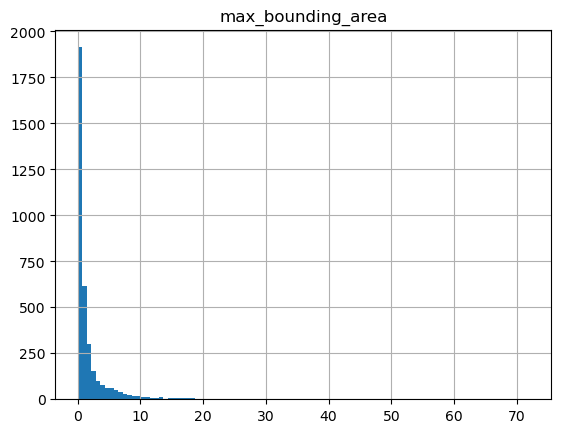

In [89]:
df_basic.hist(column='max_bounding_area',bins = 100)

In [24]:
# Checkin the overlapp area for the tiled positive images of afo
df_tiled_afo = pd.DataFrame(columns = ['label','area'])

In [25]:
df_tiled_afo['label'] = glob.glob(r'/Users/krish/ljmu/1.data/afo/tiled/ts/*.jpg')

In [26]:
%%time
df_tiled_afo['area'] = df_tiled_afo['label'].apply(max_area_finder)

CPU times: user 54 s, sys: 3.31 s, total: 57.3 s
Wall time: 1min 5s


In [27]:
df_tiled_afo


,label,area
0,/Users/krish/ljmu/1.data/afo/tiled/ts/a_1178_1...,2.070000
1,/Users/krish/ljmu/1.data/afo/tiled/ts/k4_184_0...,2.049600
2,/Users/krish/ljmu/1.data/afo/tiled/ts/b1_211_2...,0.252000
3,/Users/krish/ljmu/1.data/afo/tiled/ts/r4_109_1...,2.374400
4,/Users/krish/ljmu/1.data/afo/tiled/ts/e_47_2_3...,1.531200
...,...,...
17948,/Users/krish/ljmu/1.data/afo/tiled/ts/k5_45_1_...,0.967600
17949,/Users/krish/ljmu/1.data/afo/tiled/ts/i3_153_0...,14.999500
17950,/Users/krish/ljmu/1.data/afo/tiled/ts/s5_252_1...,1.370235
17951,/Users/krish/ljmu/1.data/afo/tiled/ts/r2_85_2_...,13.249600


array([[<AxesSubplot: title={'center': 'area'}>]], dtype=object)

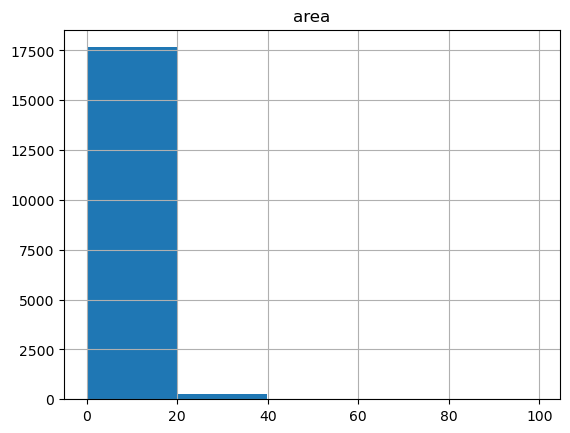

In [29]:
df_tiled_afo.hist(column='area',bins = 5)

In [36]:
df_tiled_afo[df_tiled_afo['area']<1].shape[0]/df_tiled_afo.shape[0]

0.1560184927310199

In [18]:
CPU times: user 8.29 s, sys: 482 ms, total: 8.77 s
Wall time: 36.8 s

hi
CPU times: user 129 µs, sys: 218 µs, total: 347 µs
Wall time: 287 µs


In [ ]:
CPU times: user 54 s, sys: 3.31 s, total: 57.3 s
Wall time: 1min 5s

### Tiling and the figures related to it 
# Correscting tiling

In [3]:
root_path =  r'/Users/krish/ljmu/1.data/afo/'

In [ ]:
# #creating a new directory called pythondirectory
# Path(newpath).mkdir(parents=True, exist_ok=True)
# Path(falsepath).mkdir(parents=True, exist_ok=True)
dont run
# specify slice width=height
slice_size = 500

# tile all images in a loop
def tiler(imname):

    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    labname = imname.replace('.jpg', '.txt')
    labels = pd.read_csv(labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])

    # we need to rescale coordinates from 0-1 to real image height and width
    labels[['x1', 'w']] = labels[['x1', 'w']] * width
    labels[['y1', 'h']] = labels[['y1', 'h']] * height

    boxes = []
    #print(labels)
    # convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
    for row in labels.iterrows():
        x1 = row[1]['x1'] - row[1]['w']/2
        y1 = (height - row[1]['y1']) - row[1]['h']/2
        x2 = row[1]['x1'] + row[1]['w']/2
        y2 = (height - row[1]['y1']) + row[1]['h']/2

        boxes.append((int(row[1]['class']), Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))

    counter = 0
    print('Image:', imname)
    # create tiles and find intersection with bounding boxes for each tile
    for i in range((height // slice_size)):
        for j in range((width // slice_size)):
            x1 = j*slice_size
            y1 = height - (i*slice_size)
            x2 = ((j+1)*slice_size) - 1
            y2 = (height - (i+1)*slice_size) + 1

            pol = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
            imsaved = False
            slice_labels = []

            for box in boxes:
                if pol.intersects(box[1]):
                    inter = pol.intersection(box[1])        

                    if not imsaved:
                        sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                        sliced_im = Image.fromarray(sliced) # conevrts the array into image. jpg
                        filename = imname.split('/')[-1]
                        ##filename = imname
                        slice_path = newpath + filename.replace('.jpg', f'_{i}_{j}.jpg')

                        slice_labels_path = newpath + filename.replace('.jpg', f'_{i}_{j}.txt')

                        print(slice_path)
                        #print('hi')
                        sliced_im.save(slice_path)
                        imsaved = True                    

                    # get the smallest polygon (with sides parallel to the coordinate axes) that contains the intersection
                    new_box = inter.envelope 

                    # get central point for the new bounding box 
                    centre = new_box.centroid

                    # get coordinates of polygon vertices
                    x, y = new_box.exterior.coords.xy

                    # get bounding box width and height normalized to slice size
                    new_width = (max(x) - min(x)) / slice_size
                    new_height = (max(y) - min(y)) / slice_size

                    # we have to normalize central x and invert y for yolo format
                    new_x = (centre.coords.xy[0][0] - x1) / slice_size
                    new_y = (y1 - centre.coords.xy[1][0]) / slice_size

                    counter += 1

                    slice_labels.append([box[0], new_x, new_y, new_width, new_height])

            # save txt with labels for the current tile
            if len(slice_labels) > 0:
                slice_df = pd.DataFrame(slice_labels, columns=['class', 'x1', 'y1', 'w', 'h'])
                #print(slice_df)
                slice_df.to_csv(slice_labels_path, sep=' ', index=False, header=False, float_format='%.6f')

            # if there are no bounding boxes intersect current tile, save this tile to a separate folder 
            if not imsaved:
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                sliced_im = Image.fromarray(sliced)
                filename = imname.split('/')[-1]
                #filename = imname
                slice_path = falsepath + filename.replace('.jpg', f'_{i}_{j}.jpg')                

                sliced_im.save(slice_path)
                print('Slice without boxes saved')
                imsaved = True
    #break

In [188]:
slice_size = 100
def tiler1(imname):

    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    
    
    fig, axs = plt.subplots((height // slice_size)+int(bool(height%slice_size)),(width // slice_size)+int(bool(width%slice_size)))    
    for i in range((height // slice_size)+int(bool(height%slice_size))):
        for j in range((width // slice_size)+int(bool(width%slice_size))):
            

            sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
            #sliced_im = Image.fromarray(sliced) # conevrts the array into image. jpg
            #sliced_im.show
            axs[i][j].imshow(sliced)
            axs[i][j].axes.get_xaxis().set_visible(False)
            axs[i][j].axes.get_yaxis().set_visible(False)
    return axs
         

In [189]:
slice_size = 100
def tiler2(imname):

    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    
    
    fig, axs = plt.subplots((height // slice_size)+int(bool(height%slice_size)),(width // slice_size)+int(bool(width%slice_size)))    
    for i in range((height // slice_size)+int(bool(height%slice_size))):
        for j in range((width // slice_size)+int(bool(width%slice_size))):
        
            
            if (i == (height // slice_size)) and (j != (width//slice_size)):
                sliced = imr[height - slice_size:height, j*slice_size:(j+1)*slice_size]
                
            elif (i != (height // slice_size)) and (j == (width//slice_size)):
                sliced = imr[i*slice_size:(i+1)*slice_size, width - slice_size:width]
                
            elif (i == (height // slice_size)) and (j == (width//slice_size)):
                sliced = imr[height - slice_size:height, width - slice_size:width]
            
            elif (i != (height // slice_size)) and (j != (width//slice_size)) :
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
            #sliced_im = Image.fromarray(sliced) # conevrts the array into image. jpg
            #sliced_im.show
            axs[i][j].imshow(sliced)
            axs[i][j].axes.get_xaxis().set_visible(False)
            axs[i][j].axes.get_yaxis().set_visible(False)
    return axs
         

In [ ]:
# get all image names
imnames = glob.glob('/Users/krish/ljmu/1.data/swimmers_dataset/krish_train/*.jpg')
#imnames = glob.glob('/content/drive/MyDrive/ljmu/1.data/swimmers_dataset/krish_train/*.jpg')
# specify path for a new tiled dataset
newpath = '/Users/krish/ljmu/1.data/sampletiled/ts/'
#newpath = '/content/drive/MyDrive/ljmu/1.data/sampletiled/ts'
falsepath = '/Users/krish/ljmu/1.data/sampletiled/false/'
#falsepath = '/content/drive/MyDrive/ljmu/1.data/sampletiled/false'
# python program to check if a path exists
#if path doesn’t exist we create a new path

#creating a new directory called pythondirectory
Path(newpath).mkdir(parents=True, exist_ok=True)
Path(falsepath).mkdir(parents=True, exist_ok=True)

# specify slice width=height
slice_size = 500

# tile all images in a loop

for imname in imnames:
    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    labname = imname.replace('.jpg', '.txt')
    labels = pd.read_csv(labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])
    
    # we need to rescale coordinates from 0-1 to real image height and width
    labels[['x1', 'w']] = labels[['x1', 'w']] * width
    labels[['y1', 'h']] = labels[['y1', 'h']] * height
    
    boxes = []
    #print(labels)
    # convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
    for row in labels.iterrows():
        x1 = row[1]['x1'] - row[1]['w']/2
        y1 = (height - row[1]['y1']) - row[1]['h']/2
        x2 = row[1]['x1'] + row[1]['w']/2
        y2 = (height - row[1]['y1']) + row[1]['h']/2

        boxes.append((int(row[1]['class']), Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))
    
    counter = 0
    print('Image:', imname)
    # create tiles and find intersection with bounding boxes for each tile
    for i in range((height // slice_size)):
        for j in range((width // slice_size)):
            x1 = j*slice_size
            y1 = height - (i*slice_size)
            x2 = ((j+1)*slice_size) - 1
            y2 = (height - (i+1)*slice_size) + 1

            pol = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
            imsaved = False
            slice_labels = []

            for box in boxes:
                if pol.intersects(box[1]):
                    inter = pol.intersection(box[1])        
                    
                    if not imsaved:
                        sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                        sliced_im = Image.fromarray(sliced)
                        filename = imname.split('/')[-1]
                        ##filename = imname
                        slice_path = newpath + filename.replace('.jpg', f'_{i}_{j}.jpg')
                        
                        slice_labels_path = newpath + filename.replace('.jpg', f'_{i}_{j}.txt')
                        
                        print(slice_path)
                        #print('hi')
                        sliced_im.save(slice_path)
                        imsaved = True                    
                    
                    # get the smallest polygon (with sides parallel to the coordinate axes) that contains the intersection
                    new_box = inter.envelope 
                    
                    # get central point for the new bounding box 
                    centre = new_box.centroid
                    
                    # get coordinates of polygon vertices
                    x, y = new_box.exterior.coords.xy
                    
                    # get bounding box width and height normalized to slice size
                    new_width = (max(x) - min(x)) / slice_size
                    new_height = (max(y) - min(y)) / slice_size
                    
                    # we have to normalize central x and invert y for yolo format
                    new_x = (centre.coords.xy[0][0] - x1) / slice_size
                    new_y = (y1 - centre.coords.xy[1][0]) / slice_size
                    
                    counter += 1

                    slice_labels.append([box[0], new_x, new_y, new_width, new_height])
            
            # save txt with labels for the current tile
            if len(slice_labels) > 0:
                slice_df = pd.DataFrame(slice_labels, columns=['class', 'x1', 'y1', 'w', 'h'])
                #print(slice_df)
                slice_df.to_csv(slice_labels_path, sep=' ', index=False, header=False, float_format='%.6f')
            
            # if there are no bounding boxes intersect current tile, save this tile to a separate folder 
            if not imsaved:
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                sliced_im = Image.fromarray(sliced)
                filename = imname.split('/')[-1]
                #filename = imname
                slice_path = falsepath + filename.replace('.jpg', f'_{i}_{j}.jpg')                

                sliced_im.save(slice_path)
                print('Slice without boxes saved')
                imsaved = True
    #break

In [201]:
slice_size = 300
newpath = '/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/'

falsepath = '/Users/krish/ljmu/1.data/afo/tiledv4/train/false/'
#creating a new directory called pythondirectory
Path(newpath).mkdir(parents=True, exist_ok=True)
Path(falsepath).mkdir(parents=True, exist_ok=True)

def tiler3(imname):
    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    labname = imname.split('/')[-1].replace('.jpg', '.txt')
    labels = pd.read_csv(root_path+'1category_labels/'+labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])
    
    # we need to rescale coordinates from 0-1 to real image height and width
    labels[['x1', 'w']] = labels[['x1', 'w']] * width
    labels[['y1', 'h']] = labels[['y1', 'h']] * height
    
    boxes = []
    #print(labels)
    # convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
    for row in labels.iterrows():
        x1 = row[1]['x1'] - row[1]['w']/2
        y1 = (height - row[1]['y1']) - row[1]['h']/2
        x2 = row[1]['x1'] + row[1]['w']/2
        y2 = (height - row[1]['y1']) + row[1]['h']/2

        boxes.append((int(row[1]['class']), Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))
    
    counter = 0
    print('Image:', imname)
    # create tiles and find intersection with bounding boxes for each tile
    fig, axs = plt.subplots((height // slice_size)+int(bool(height%slice_size)),(width // slice_size)+int(bool(width%slice_size)))    
    for i in range((height // slice_size)+int(bool(height%slice_size))):
        for j in range((width // slice_size)+int(bool(width%slice_size))):
            
            if (i == (height // slice_size)) and (j != (width//slice_size)):
                sliced = imr[height - slice_size:height, j*slice_size:(j+1)*slice_size]
                x1 = width - slice_size
                y1 = height - (i*slice_size)
                x2 = width
                y2 = (height - (i+1)*slice_size) + 1
                
            elif (i != (height // slice_size)) and (j == (width//slice_size)):
                sliced = imr[i*slice_size:(i+1)*slice_size, width - slice_size:width]
                x1 = j*slice_size
                y1 = height - (height - slice_size)
                x2 = ((j+1)*slice_size) - 1
                y2 = 0
                
            elif (i == (height // slice_size)) and (j == (width//slice_size)):
                sliced = imr[height - slice_size:height, width - slice_size:width]
                x1 = width - slice_size
                y1 = height - (height - slice_size)
                x2 = width
                y2 = 0
            
            elif (i != (height // slice_size)) and (j != (width//slice_size)) :
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                x1 = j*slice_size
                y1 = height - (i*slice_size)
                x2 = ((j+1)*slice_size) - 1
                y2 = (height - (i+1)*slice_size) + 1
            
            pol = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
            imsaved = False
            slice_labels = []
            
            
            
            for box in boxes:
                if pol.intersects(box[1]):
                    inter = pol.intersection(box[1])        
                    
                    if not imsaved:
                      
                        sliced_im = Image.fromarray(sliced)
                        filename = imname.split('/')[-1]
                        ##filename = imname
                        slice_path = newpath + filename.replace('.jpg', f'_{i}_{j}.jpg')
                        
                        slice_labels_path = newpath + filename.replace('.jpg', f'_{i}_{j}.txt')
                        
                        print(slice_path)
                        #print('hi')
                        sliced_im.save(slice_path)
                        imsaved = True                    
                    
                    # get the smallest polygon (with sides parallel to the coordinate axes) that contains the intersection
                    new_box = inter.envelope 
                    
                    # get central point for the new bounding box 
                    centre = new_box.centroid
                    
                    # get coordinates of polygon vertices
                    x, y = new_box.exterior.coords.xy
                    
                    # get bounding box width and height normalized to slice size
                    new_width = (max(x) - min(x)) / slice_size
                    new_height = (max(y) - min(y)) / slice_size
                    
                    # we have to normalize central x and invert y for yolo format
                    new_x = (centre.coords.xy[0][0] - x1) / slice_size
                    new_y = (y1 - centre.coords.xy[1][0]) / slice_size
                    
                    counter += 1

                    slice_labels.append([box[0], new_x, new_y, new_width, new_height])
                    
            if len(slice_labels) > 0:
                slice_df = pd.DataFrame(slice_labels, columns=['class', 'x1', 'y1', 'w', 'h'])
                #print(slice_df)
                slice_df.to_csv(slice_labels_path, sep=' ', index=False, header=False, float_format='%.6f')
            
            # if there are no bounding boxes intersect current tile, save this tile to a separate folder 
            if not imsaved:
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                sliced_im = Image.fromarray(sliced)
                filename = imname.split('/')[-1]
                #filename = imname
                slice_path = falsepath + filename.replace('.jpg', f'_{i}_{j}.jpg')                

                sliced_im.save(slice_path)
                print('Slice without boxes saved')
                imsaved = True


In [190]:
int(bool(32))

1

In [191]:
if (height%slice_size) or (width%slice_size):
if height%slice_size:
    height_off_shape = 1
        if width%slice_size:
            
fig, axs = plt.subplots((height // slice_size)+int(bool(height%slice_width)),(width // slice_size)+int(bool(width%slice_width)))    

IndentationError: expected an indented block (651629561.py, line 2)

In [192]:
int(bool(3))

1

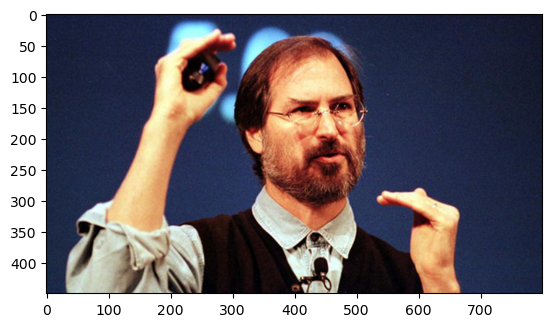

In [193]:
# Split a single image into tiles and then plot : this is the fucking task just do this 
imname = root_path+'images/a_304.jpg'
imname = '/Users/krish/Downloads/imagegroup.jpeg'
im = Image.open(imname)
plt.imshow(im)


In [194]:
# imr = np.array(im, dtype=np.uint8)
# Image.fromarray(imr)

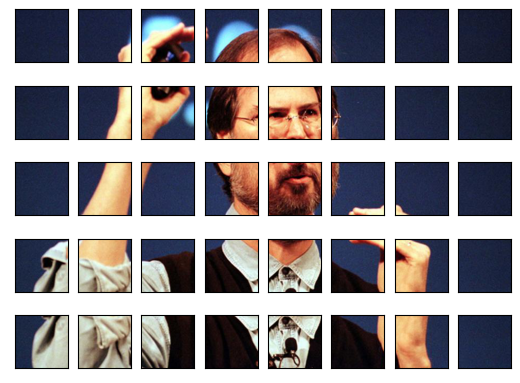

In [196]:
yele = tiler2(imname)

array([[<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >]], dtype=object)

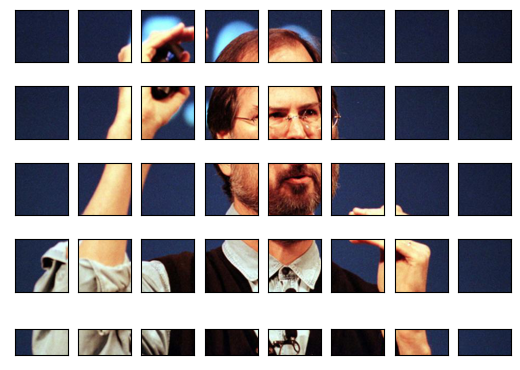

In [197]:
tiler1(imname)

Image: /Users/krish/ljmu/1.data/afo/images/a_304.jpg
Slice without boxes saved
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_0_1.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_0_2.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_0_3.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_0_4.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_0_5.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_0_6.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_0_7.jpg
Slice without boxes saved
Slice without boxes saved
Slice without boxes saved
Slice without boxes saved
Slice without boxes saved
Slice without boxes saved
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_1_1.jpg
Slice without boxes saved
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_1_3.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_1_4.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_1_5.jpg
/Users/krish/ljmu/1.data/afo/tiledv4/train/ts/a_304_1_6.jpg
/Users/krish/ljmu/1

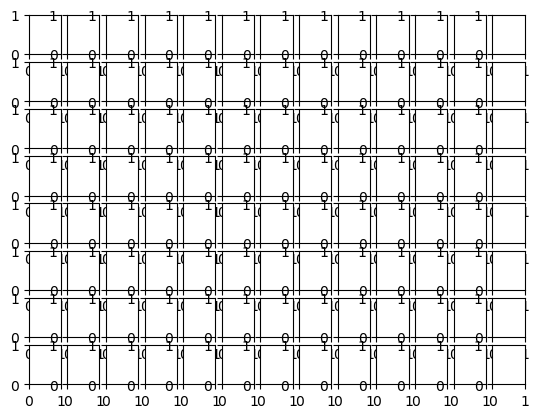

In [202]:
imname = root_path+'images/a_304.jpg'
tiler3(imname)

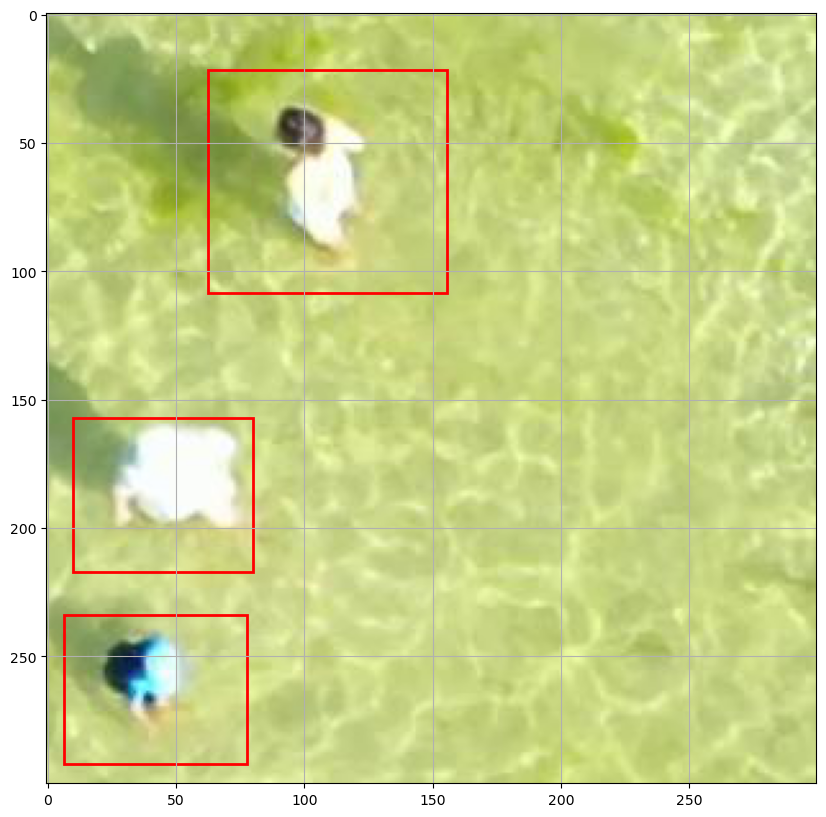

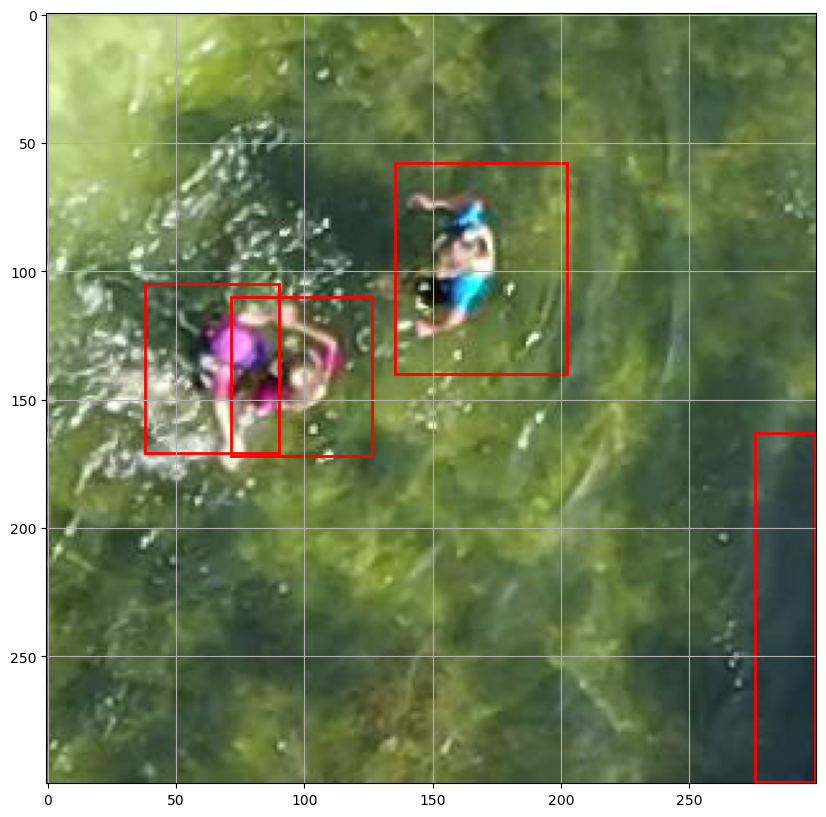

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]


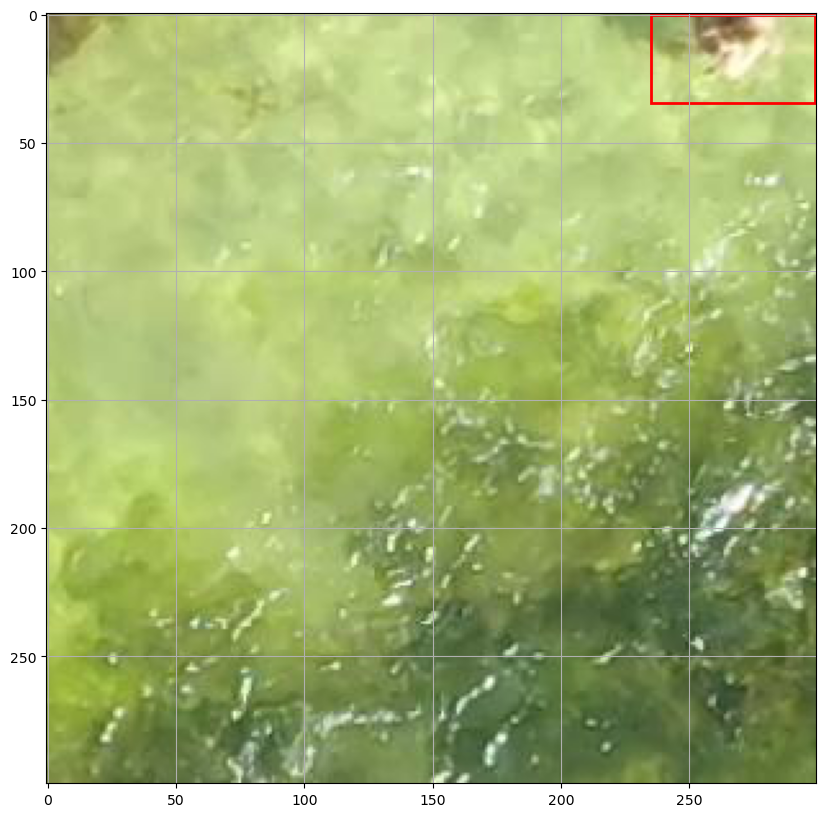

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]


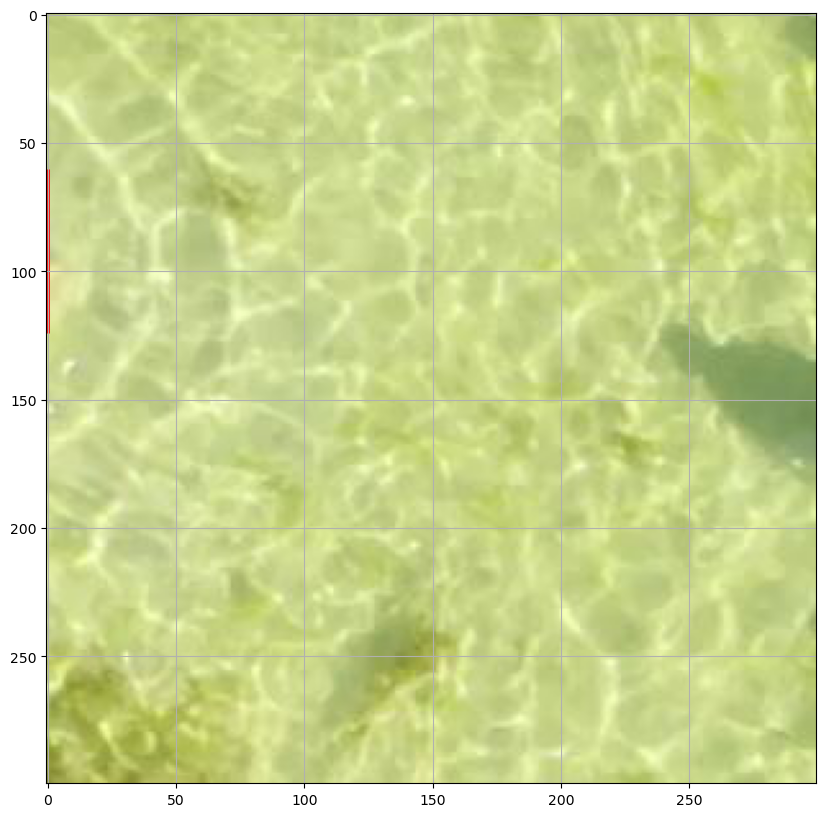

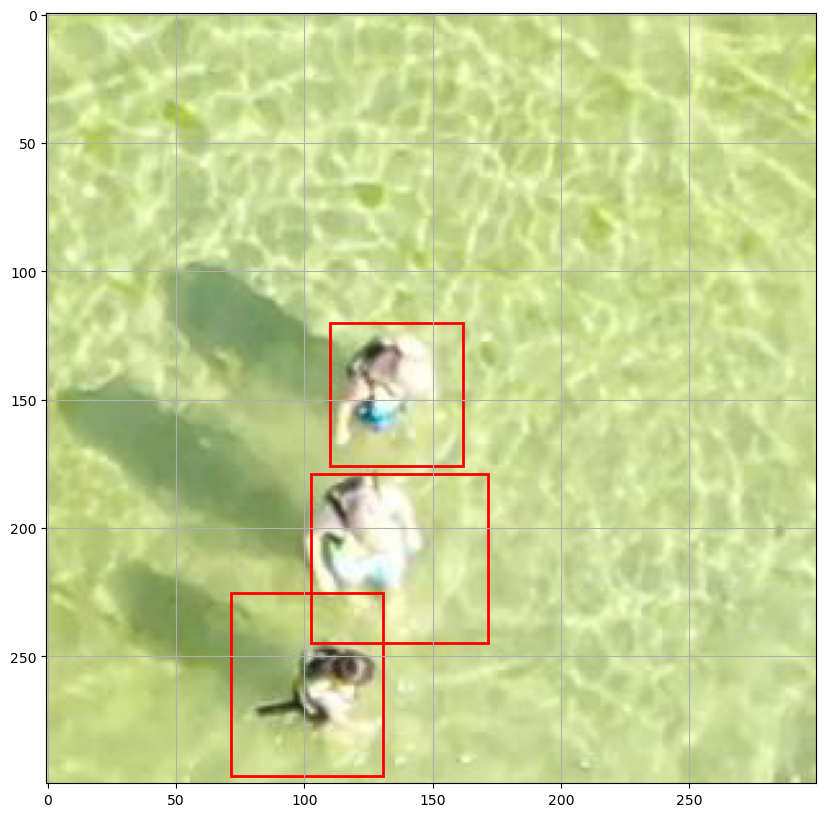

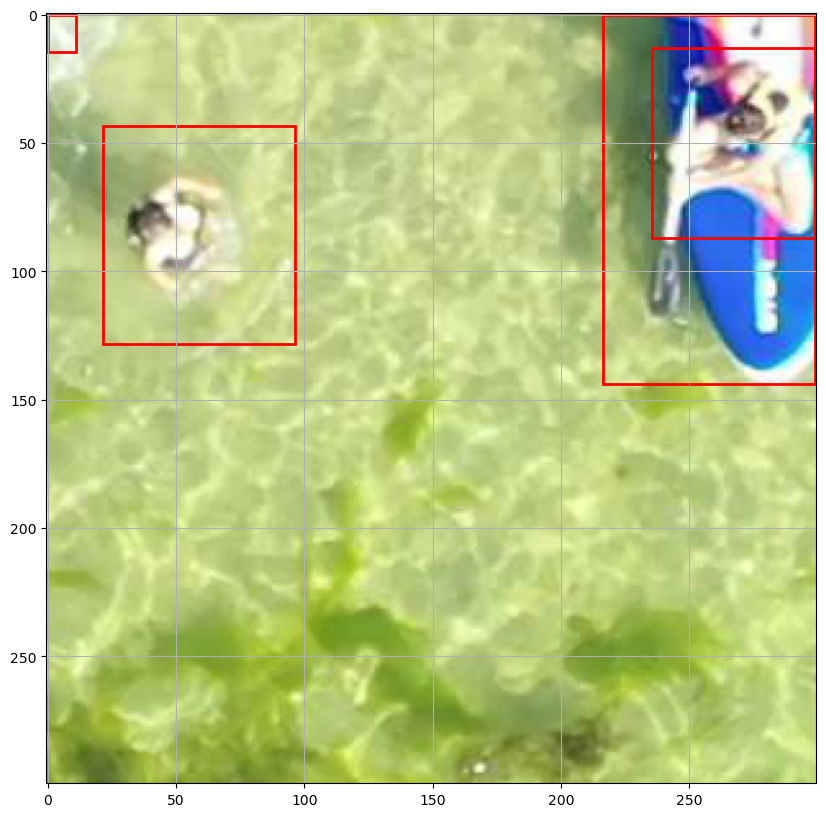

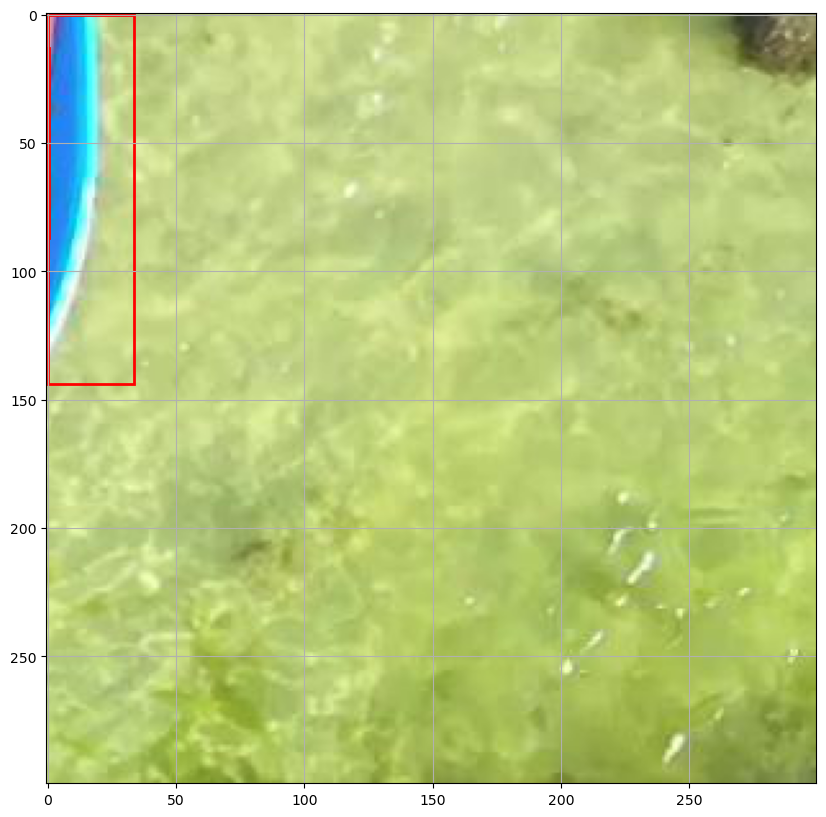

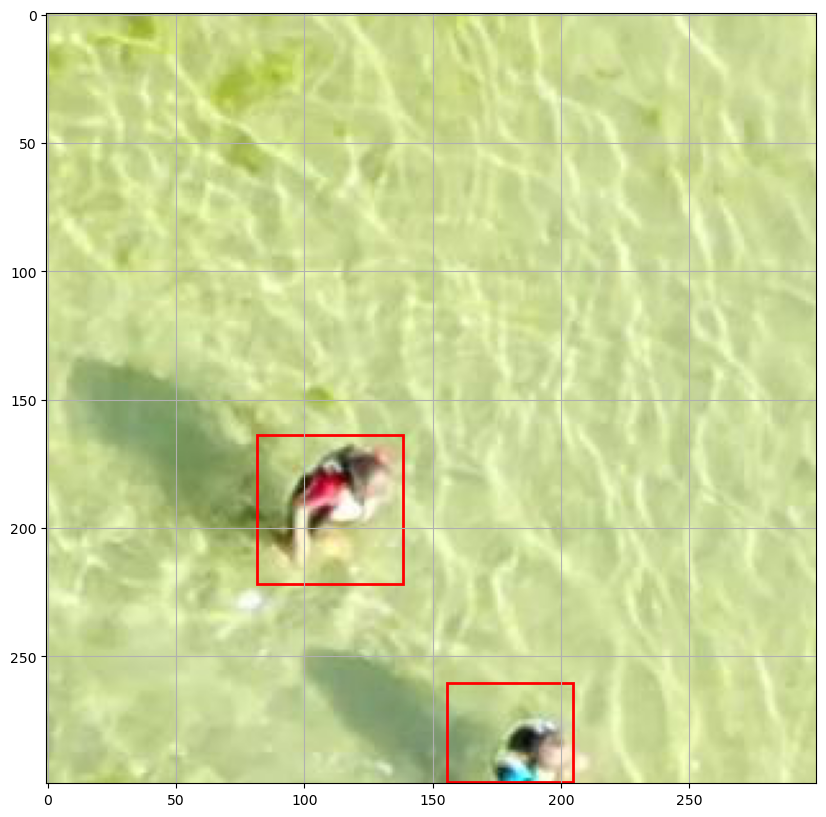

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]


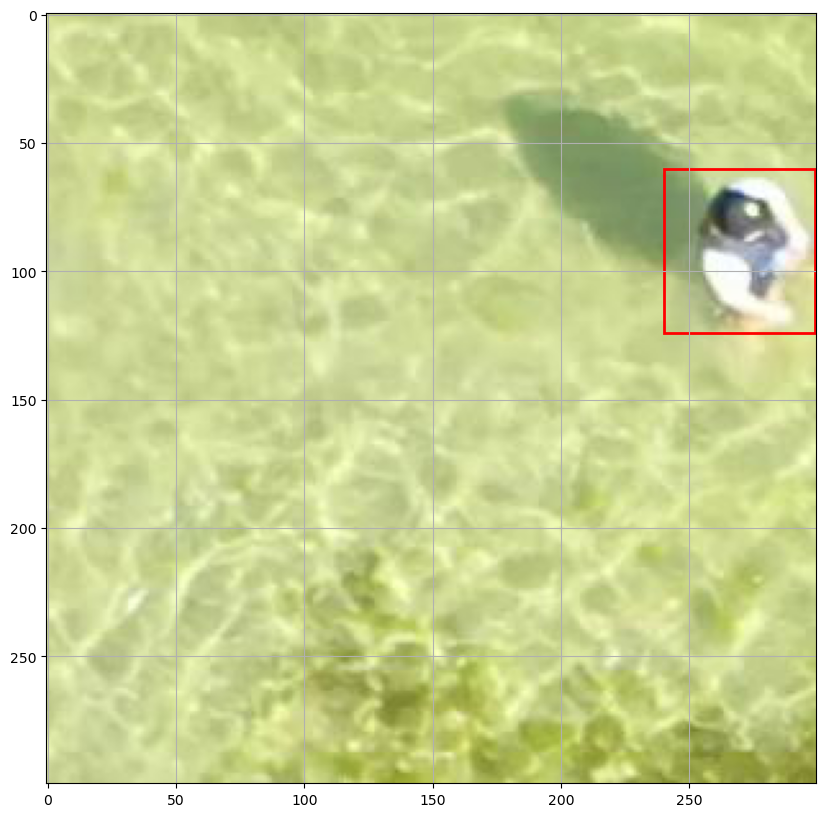

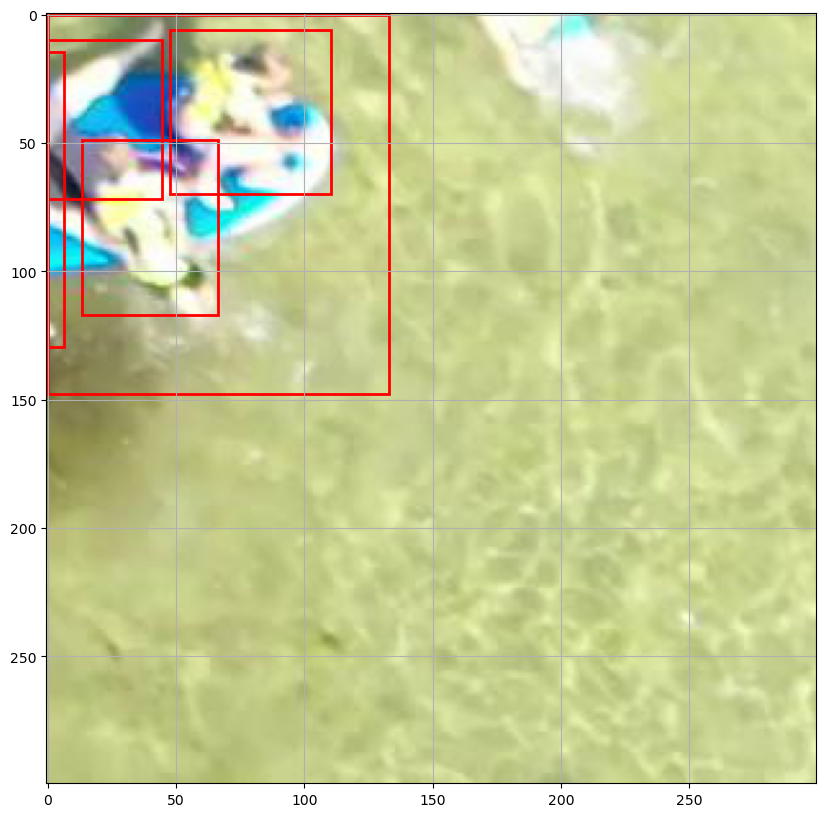

/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
/var/folders/zk/p2gyqg915639vx6xr9xbs9cm0000gn/T/ipykernel_34447/3686379391.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]


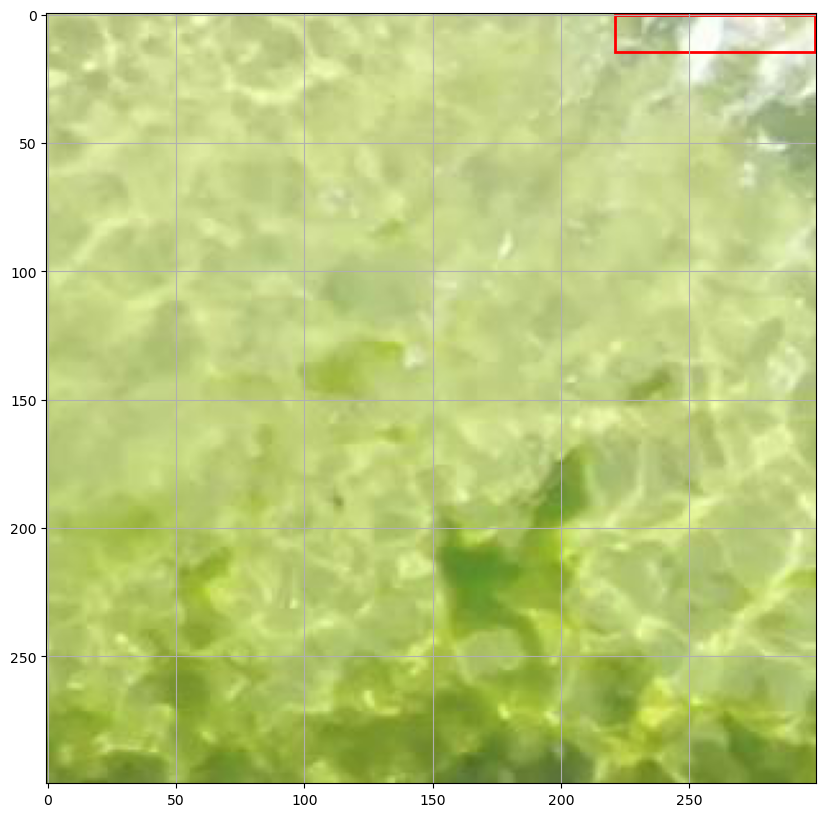

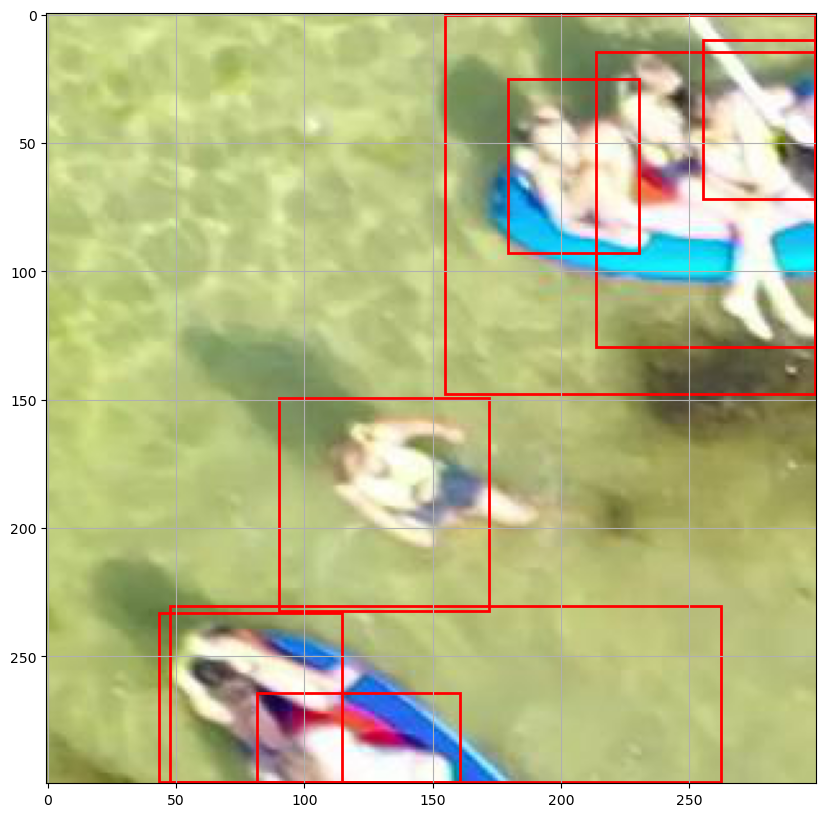

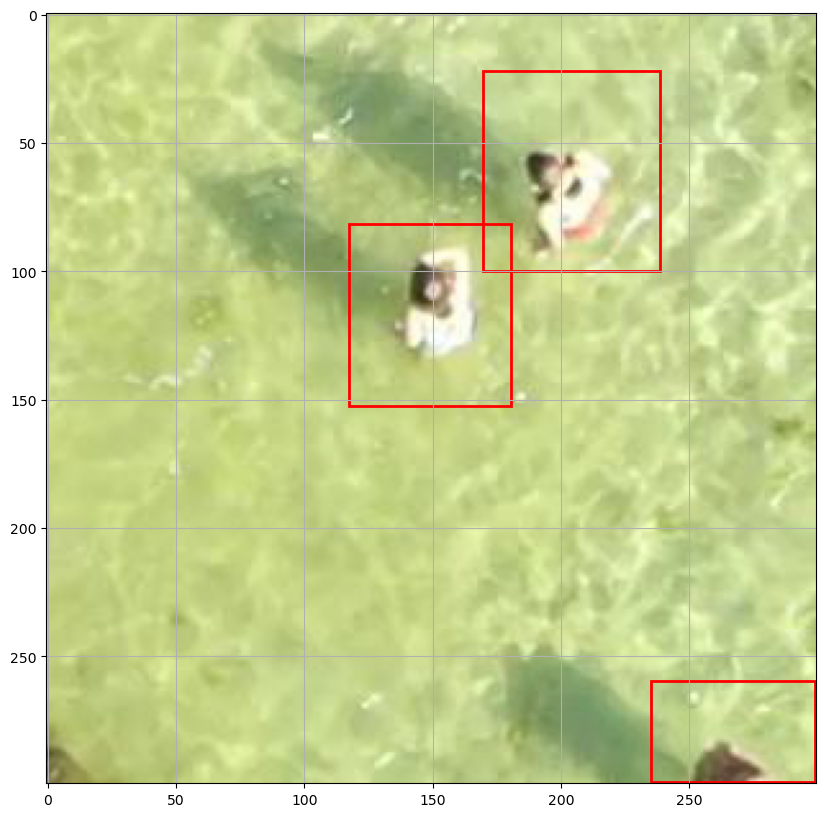

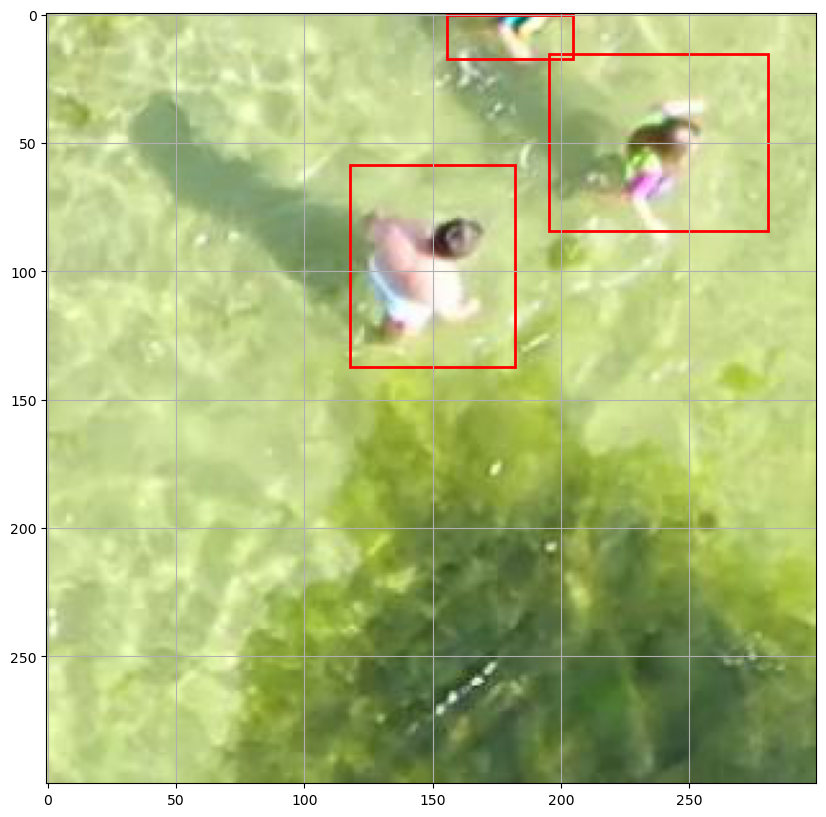

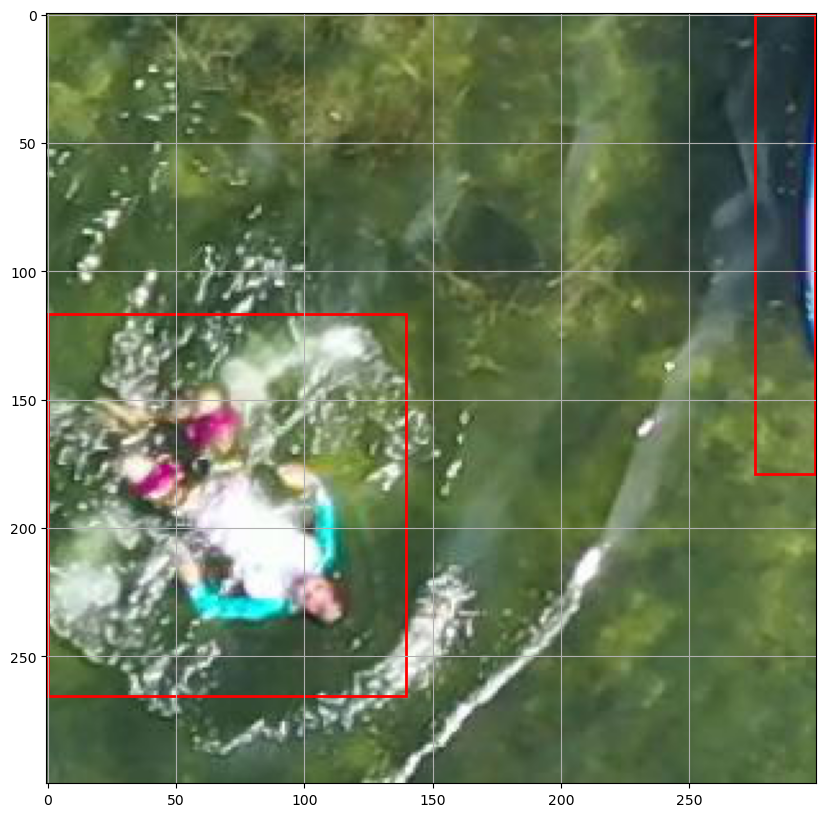

...

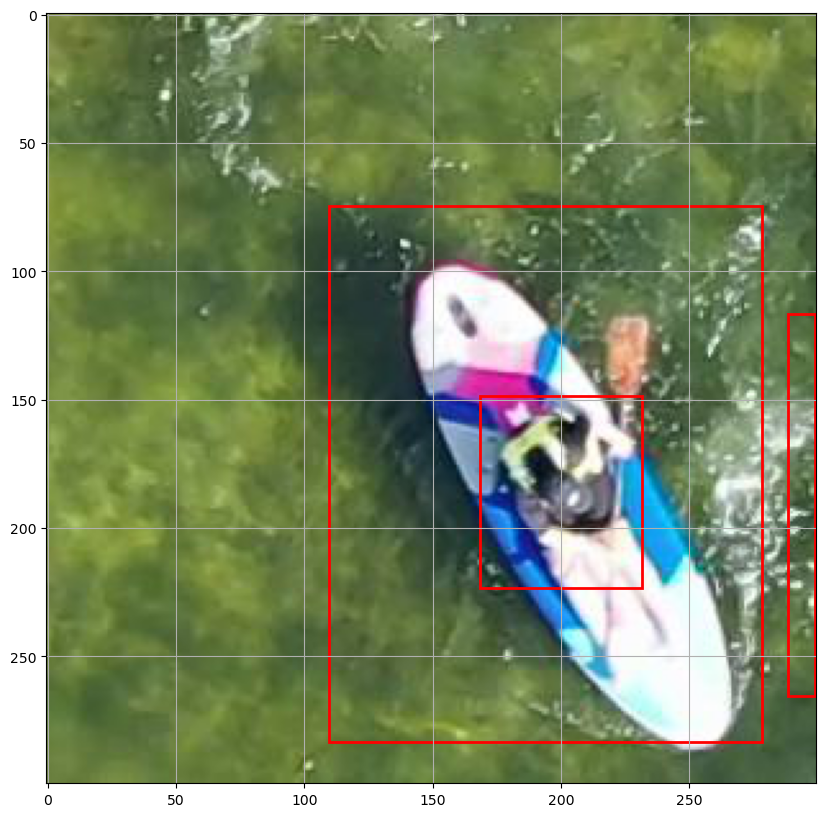

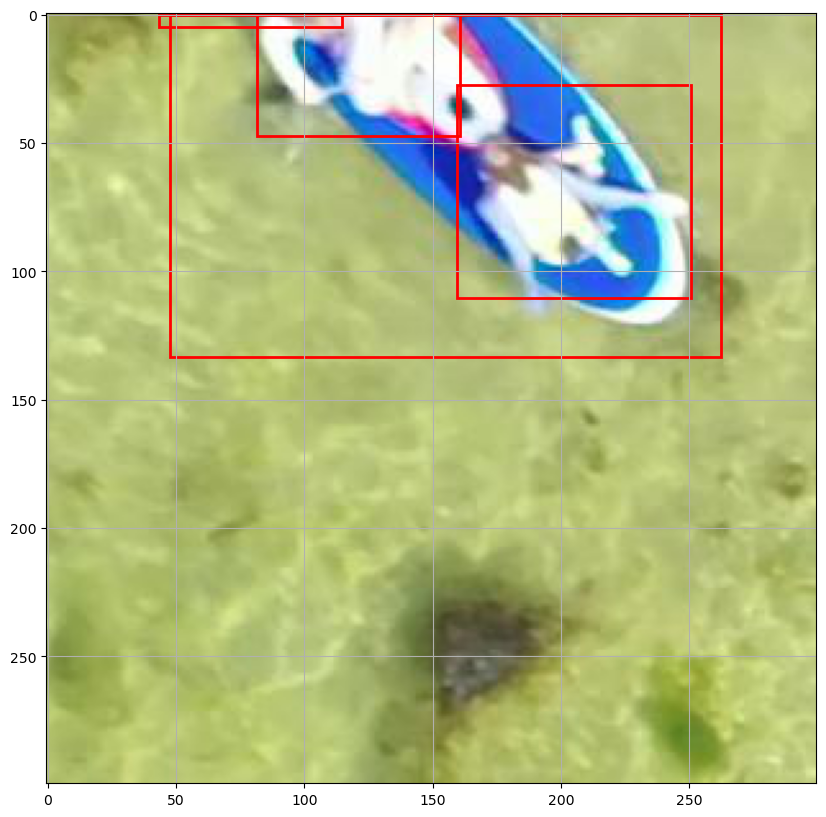

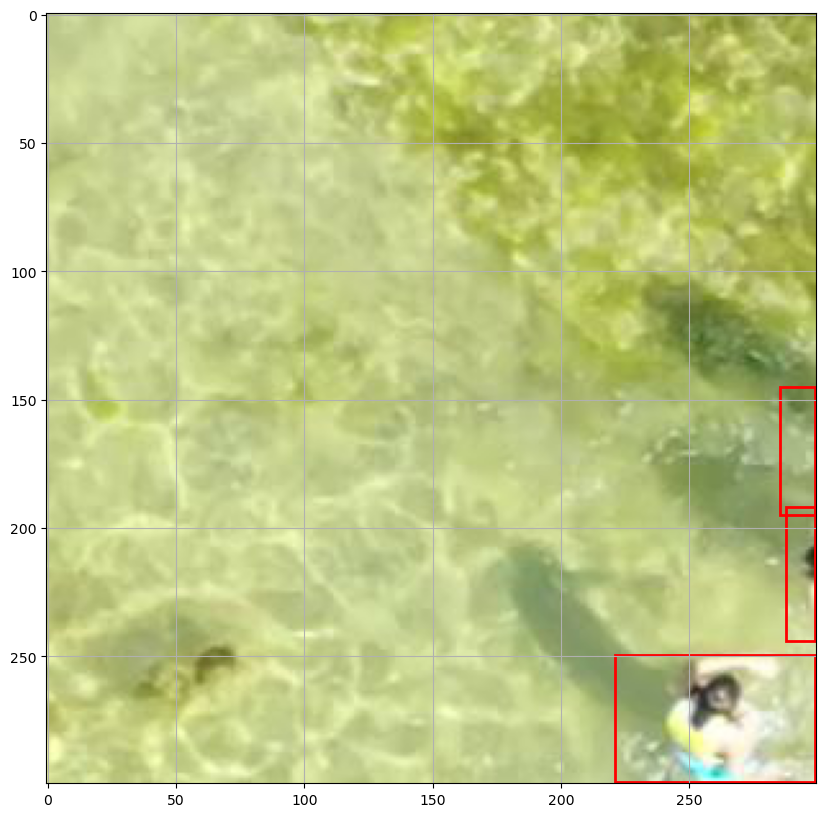

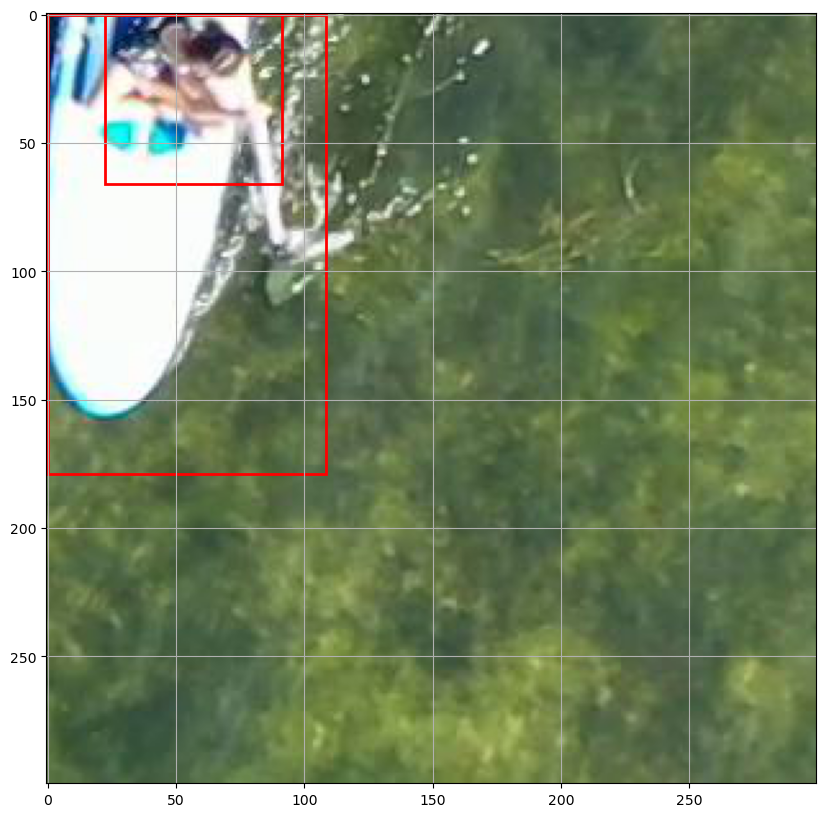

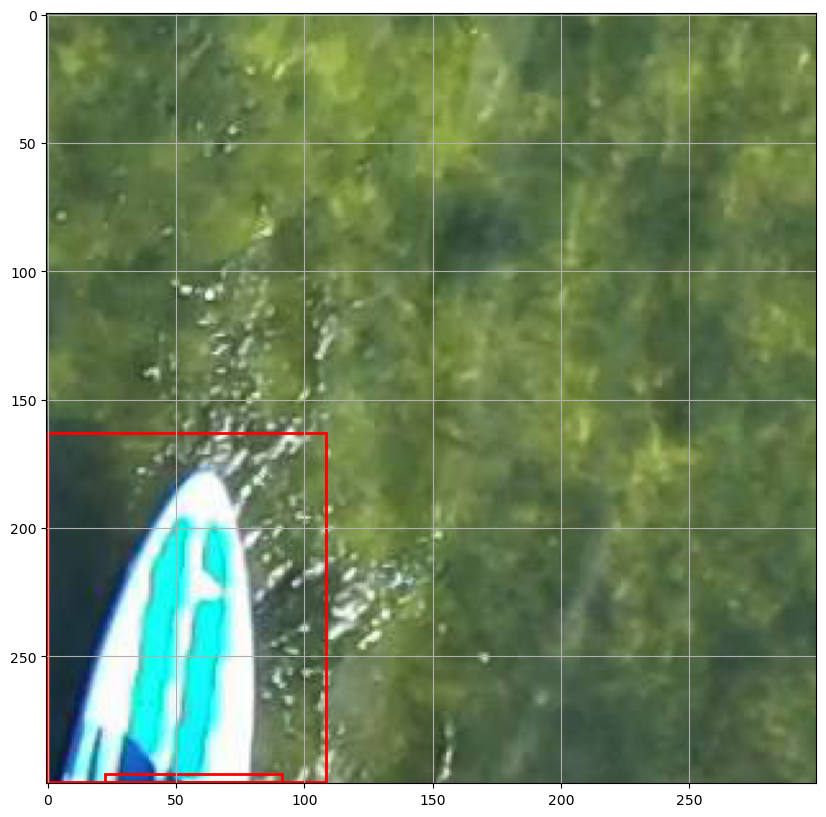

In [206]:
for imname in glob.glob(root_path+'tiledv4/train/ts/*.jpg'):
    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)

    labname = imname.replace('.jpg', '.txt')
    df = pd.read_csv(labname, sep=' ', names=['class', 'x1', 'y1', 'w', 'h'])

    df_scaled = df.iloc[:, 1:]
    df_scaled[['x1', 'w']] = df_scaled[['x1', 'w']] * imr.shape[1]
    df_scaled[['y1', 'h']] = df_scaled[['y1', 'h']] * imr.shape[0]

    fig,ax = plt.subplots(1, figsize=(10,10))# Display the image
    ax.imshow(imr)
    for box in df_scaled.values:
        # Create a Rectangle patch
        rect = patches.Rectangle((box[0]-(box[2]/2),box[1]-(box[3]/2)),box[2],box[3],linewidth=2,edgecolor='r',facecolor='none')# Add the patch to the axes
        ax.add_patch(rect)
    plt.grid(alpha = 1)    
    plt.show()

In [180]:
for i in range(1):
    print(i)

0


In [152]:
#05122022
# requirement: 2 figures with 300X300 and 500X500 grid. Without overlap 

def tiler0(imname, slice_size):
    
    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    
    
    fig, axs = plt.subplots((height // slice_size),(width // slice_size))    
    for i in range((height // slice_size)):#+int(bool(height%slice_size))):
        for j in range((width // slice_size)):#+int(bool(width%slice_size))):
            

            sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
            #sliced_im = Image.fromarray(sliced) # conevrts the array into image. jpg
            #sliced_im.show
            axs[i][j].imshow(sliced)
            axs[i][j].axes.get_xaxis().set_visible(False)
            axs[i][j].axes.get_yaxis().set_visible(False)
            axs[i][j].set_aspect('equal')
    #fig.subplots_adjust(wspace=0., hspace=0.)
    #return axs

def tiler1(imname,slice_size):

    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    
    
    fig, axs = plt.subplots((height // slice_size)+int(bool(height%slice_size)),(width // slice_size)+int(bool(width%slice_size)))    
    for i in range((height // slice_size)):#+int(bool(height%slice_size))):
        for j in range((width // slice_size)):#(+int(bool(width%slice_size))):
            

            sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
            #sliced_im = Image.fromarray(sliced) # conevrts the array into image. jpg
            #sliced_im.show
            axs[i][j].imshow(sliced)
            axs[i][j].axes.get_xaxis().set_visible(False)
            axs[i][j].axes.get_yaxis().set_visible(False)
    #axs[][].axes.get_yaxis().set_visible(False)
    return axs

def tiler2(imname,slice_size):

    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]
    
    
    fig, axs = plt.subplots((height // slice_size)+int(bool(height%slice_size)),(width // slice_size)+int(bool(width%slice_size)))    
    for i in range((height // slice_size)+int(bool(height%slice_size))):
        for j in range((width // slice_size)+int(bool(width%slice_size))):
        
            
            if (i == (height // slice_size)) and (j != (width//slice_size)):
                sliced = imr[height - slice_size:height, j*slice_size:(j+1)*slice_size]
                
            elif (i != (height // slice_size)) and (j == (width//slice_size)):
                sliced = imr[i*slice_size:(i+1)*slice_size, width - slice_size:width]
                
            elif (i == (height // slice_size)) and (j == (width//slice_size)):
                sliced = imr[height - slice_size:height, width - slice_size:width]
            
            elif (i != (height // slice_size)) and (j != (width//slice_size)) :
                sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
            #sliced_im = Image.fromarray(sliced) # conevrts the array into image. jpg
            #sliced_im.show
            axs[i][j].imshow(sliced)
            axs[i][j].axes.get_xaxis().set_visible(False)
            axs[i][j].axes.get_yaxis().set_visible(False)

         
         

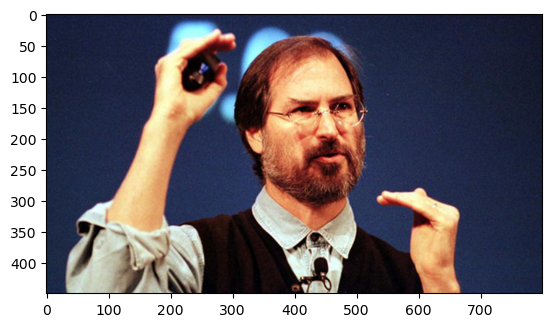

In [107]:

imname = '/Users/krish/Downloads/imagegroup.jpeg'
im = Image.open(imname)
plt.imshow(im)

In [93]:
tiler1(imname)

TypeError: tiler1() missing 1 required positional argument: 'slice_size'

In [94]:
tiler0(imname)

TypeError: tiler0() missing 1 required positional argument: 'slice_size'

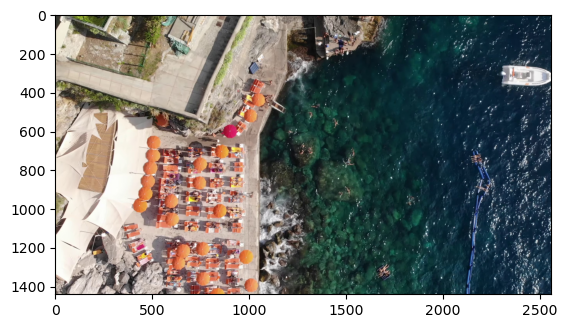

In [112]:
# I choose i1_6.jpg for this task
imname = '/Users/krish/ljmu/1.data/afo/images/i1_6.jpg'
im = Image.open(imname)
plt.imshow(im)

In [113]:
# fig = plt.imshow(im)
# ax = plt.gca();
# #ax.grid( which = 'major',axis = 'x',color='w', linestyle='-', linewidth=2)


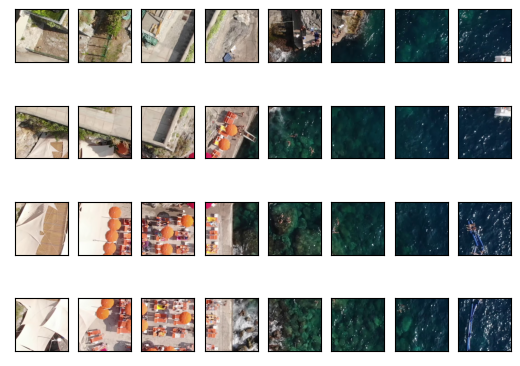

In [134]:
tiler0(imname,300)

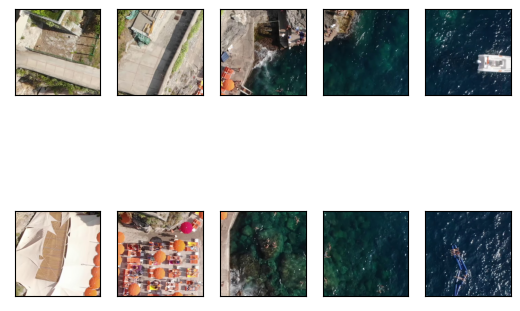

In [135]:
tiler0(imname,500)

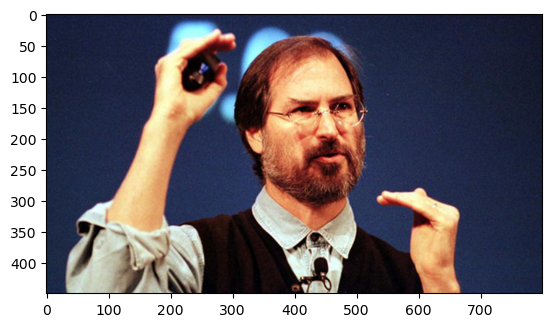

In [136]:

imname = '/Users/krish/Downloads/imagegroup.jpeg'
im = Image.open(imname)
plt.imshow(im)

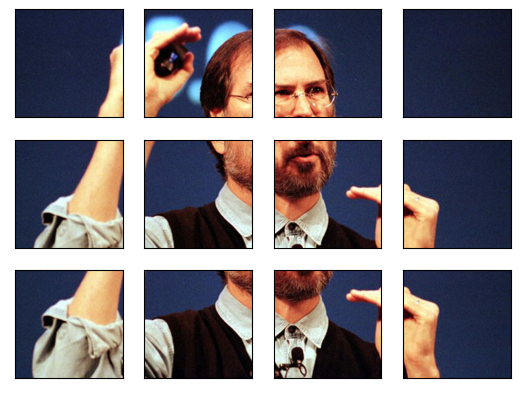

In [155]:
tiler2(imname,200)

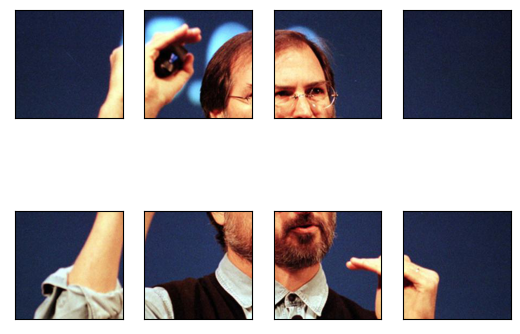

In [156]:
tiler0(imname,200)